In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
bank_loan_df=pd.read_excel('power query loan case study1.xlsx',sheet_name='data')

In [3]:
bank_loan_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,INCOME RANGE,AMT_CREDIT,...,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,Years Birth,Years Employed
0,100002.0,1.0,Cash loans,M,N,Y,0.0,202500.0,200000-225000,406597.5,...,2.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,25.920548,9.994521
1,100004.0,0.0,Revolving loans,M,Y,Y,0.0,67500.0,50000-75000,135000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,52.180822,11.671233
2,100008.0,0.0,Cash loans,M,N,Y,0.0,99000.0,75000-100000,490495.5,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,46.413699,13.616438
3,100009.0,0.0,Cash loans,F,Y,Y,1.0,171000.0,150000-175000,1560726.0,...,1.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,37.747945,3.323288
4,100010.0,0.0,Cash loans,M,Y,Y,0.0,360000.0,350000-375000,1530000.0,...,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,51.643836,12.594521


In [4]:
bank_loan_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 202242 entries, 0 to 202241
Data columns (total 46 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   202241 non-null  float64
 1   TARGET                       202241 non-null  float64
 2   NAME_CONTRACT_TYPE           202241 non-null  object 
 3   CODE_GENDER                  202241 non-null  object 
 4   FLAG_OWN_CAR                 202241 non-null  object 
 5   FLAG_OWN_REALTY              202241 non-null  object 
 6   CNT_CHILDREN                 202241 non-null  float64
 7   AMT_INCOME_TOTAL             202241 non-null  float64
 8   INCOME RANGE                 202241 non-null  object 
 9   AMT_CREDIT                   202242 non-null  float64
 10  CREDIT RANGE                 202241 non-null  object 
 11  AMT_ANNUITY                  202230 non-null  float64
 12  AMT_GOODS_PRICE              202044 non-null  float64
 13 

In [5]:
bank_loan_df=bank_loan_df.dropna(subset=['TARGET'])

In [6]:
bank_loan_df['TARGET']=bank_loan_df['TARGET'].astype('int64')

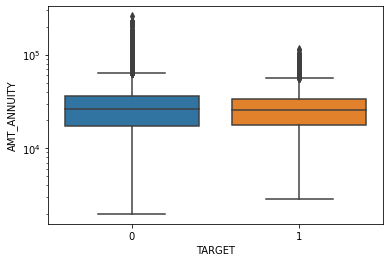

In [7]:
sns.boxplot(data=bank_loan_df, x='TARGET',y="AMT_ANNUITY")
plt.yscale('log')
plt.show()

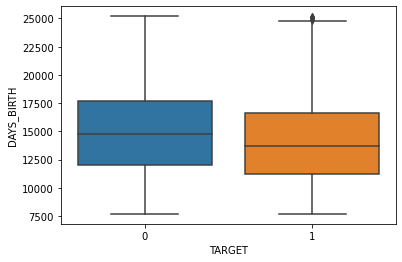

In [8]:
sns.boxplot(data=bank_loan_df, x='TARGET', y='DAYS_BIRTH')
plt.show()

In [9]:
# Dividing the dataset into two dataset of  target=1(client with payment difficulties) and target=0(all other)

target0=bank_loan_df.loc[bank_loan_df["TARGET"]==0]
target1=bank_loan_df.loc[bank_loan_df["TARGET"]==1]

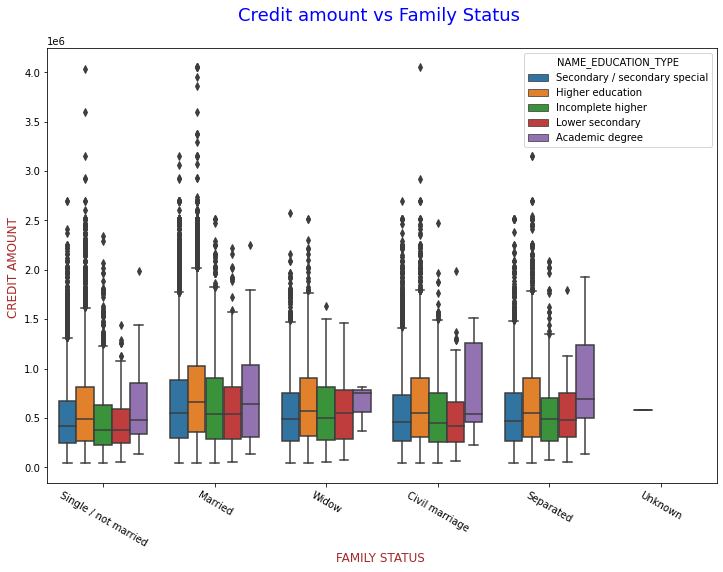

In [10]:
#Checking for Credit amount provided to the customers based on their Family type
#and plotted according their Eduaction status
plt.figure(figsize=(12,8))
scale_factor=5
sns.boxplot(data=target0,x=target0.NAME_FAMILY_STATUS,y=target0.AMT_CREDIT,hue=target0.NAME_EDUCATION_TYPE)
plt.xticks(rotation=-30)
plt.xlabel("FAMILY STATUS ", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.ylabel("CREDIT AMOUNT ", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.title('Credit amount vs Family Status \n',fontdict={'fontsize': 18, 'fontweight' : 10, 'color' : 'Blue'})
plt.show()

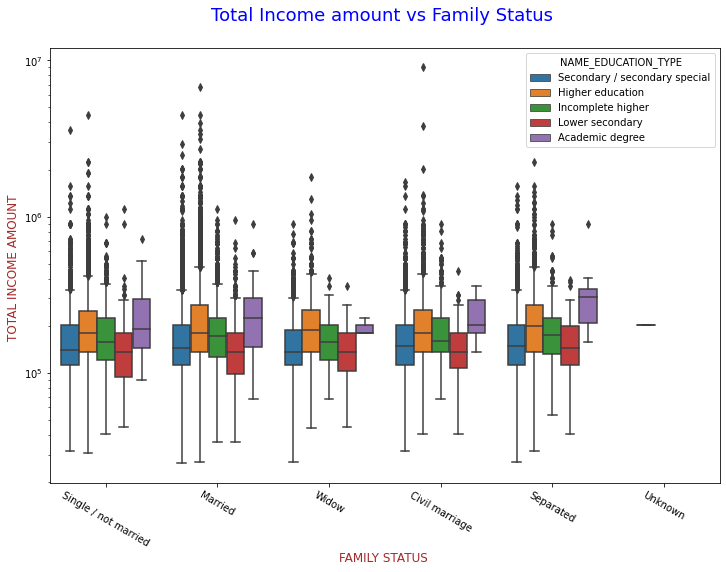

In [11]:
#Checking for Income amount of the customers based on their Family type 
#and plotted according their Education status
plt.figure(figsize=(12,8))
scale_factor=5
sns.boxplot(data=target0,x=target0.NAME_FAMILY_STATUS,y=target0.AMT_INCOME_TOTAL,hue=target0.NAME_EDUCATION_TYPE)
plt.xticks(rotation=-30)
plt.xlabel("FAMILY STATUS ", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.ylabel("TOTAL INCOME AMOUNT ", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.yscale('log')
plt.title('Total Income amount vs Family Status \n',fontdict={'fontsize': 18, 'fontweight' : 10, 'color' : 'Blue'})
plt.show()

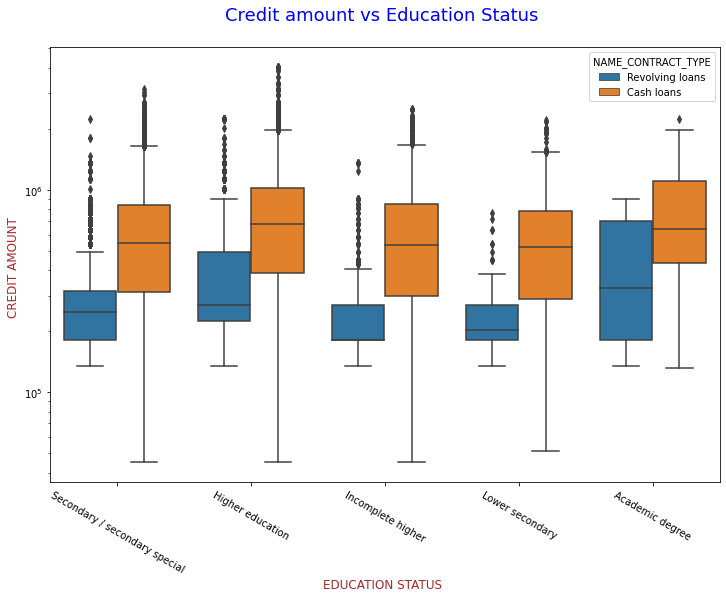

In [12]:
#Checking for Credit amount provided to the customers based on their education 
#and plotted according the Contract types of loans they are applying for.
plt.figure(figsize=(12,8))
scale_factor=5
sns.boxplot(data=target0,x=target0.NAME_EDUCATION_TYPE,y=target0.AMT_CREDIT,hue=target0.NAME_CONTRACT_TYPE)
plt.xticks(rotation=-30)
plt.xlabel("EDUCATION STATUS ", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.ylabel("CREDIT AMOUNT ", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.yscale('log')
plt.title('Credit amount vs Education Status \n',fontdict={'fontsize': 18, 'fontweight' : 10, 'color' : 'Blue'})
plt.show()

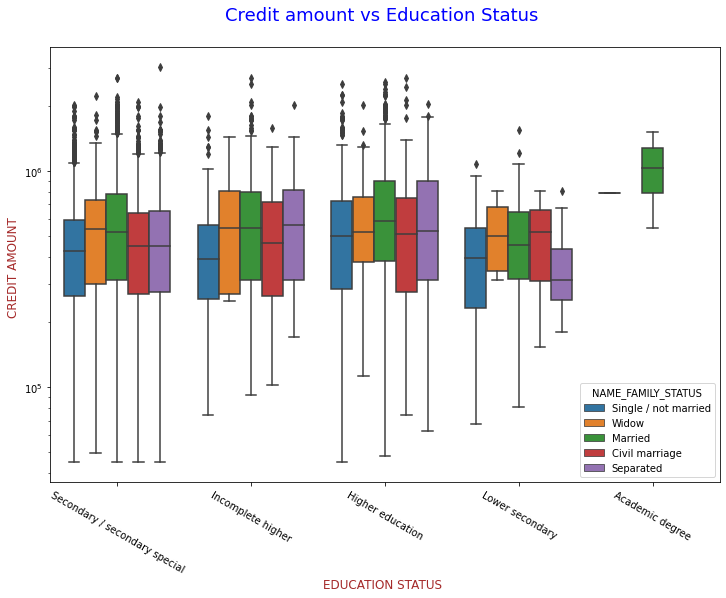

In [13]:
#Checking for Credit amount provided to the customers based on their education 
#and plotted according their family status
plt.figure(figsize=(12,8))
scale_factor=5
sns.boxplot(data=target1,x=target1.NAME_EDUCATION_TYPE,y=target1.AMT_CREDIT,hue=target1.NAME_FAMILY_STATUS)
plt.xticks(rotation=-30)
plt.xlabel("EDUCATION STATUS ", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.ylabel("CREDIT AMOUNT ", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.yscale('log')
plt.title('Credit amount vs Education Status \n',fontdict={'fontsize': 18, 'fontweight' : 10, 'color' : 'Blue'})
plt.show()

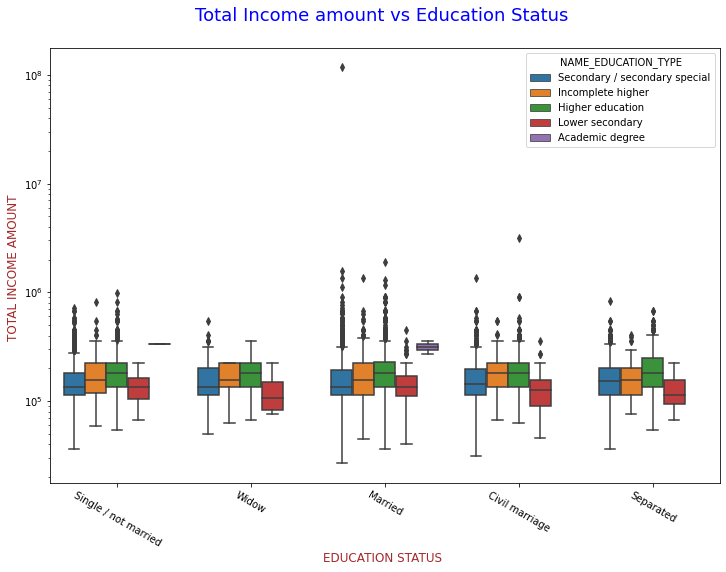

In [14]:
#Checking for Income amount of the customers based on their education 
#and plotted according their family status
plt.figure(figsize=(12,8))
scale_factor=5
sns.boxplot(data=target1,x=target1.NAME_FAMILY_STATUS,y=target1.AMT_INCOME_TOTAL,hue=target1.NAME_EDUCATION_TYPE)
plt.xticks(rotation=-30)
plt.xlabel("EDUCATION STATUS ", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.ylabel("TOTAL INCOME AMOUNT ", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.yscale('log')
plt.title('Total Income amount vs Education Status \n',fontdict={'fontsize': 18, 'fontweight' : 10, 'color' : 'Blue'})
plt.show()

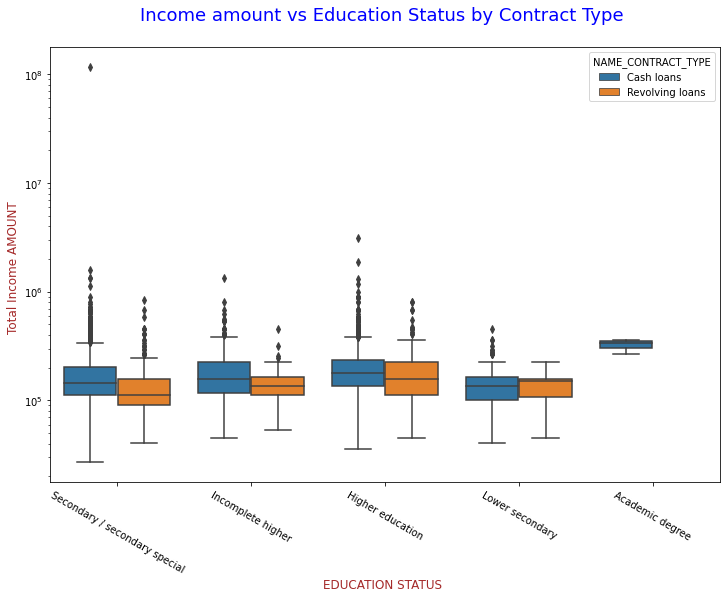

In [15]:
#Checking for Income amount provided to the customers based on their education 
#and plotted according the Contract types of loans they are applying for.
plt.figure(figsize=(12,8))
scale_factor=5
sns.boxplot(data=target1,x=target1.NAME_EDUCATION_TYPE,y=target1.AMT_INCOME_TOTAL,hue=target1.NAME_CONTRACT_TYPE)
plt.xticks(rotation=-30)
plt.xlabel("EDUCATION STATUS ", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.ylabel("Total Income AMOUNT ", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.yscale('log')
plt.title('Income amount vs Education Status by Contract Type \n',fontdict={'fontsize': 18, 'fontweight' : 10, 'color' : 'Blue'})
plt.show()

In [16]:
#Creating a correlation table between all the variables of targeto dataframe
target0_correlation=target0.iloc[:,2:].corr()
target0_correlation

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,...,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,Years Birth,Years Employed
CNT_CHILDREN,1.000000,-0.012467,-0.021170,-0.007474,-0.024442,-0.028060,-0.261302,-0.070113,-0.166412,0.119282,...,0.019652,0.001688,-0.001450,-0.000395,-0.001577,-0.022482,-0.005214,-0.033035,-0.261302,-0.166412
AMT_INCOME_TOTAL,-0.012467,1.000000,0.347633,0.427603,0.354205,0.181880,0.038800,0.020324,-0.040131,0.016887,...,-0.030713,-0.027344,0.001553,0.009947,0.006962,0.057621,0.012699,0.026676,0.038800,-0.040131
AMT_CREDIT,-0.021170,0.347633,1.000000,0.765113,0.986591,0.102092,0.141961,0.077273,0.014998,0.027054,...,-0.004079,-0.023227,-0.004036,0.006797,-0.003597,0.053829,0.023017,-0.051650,0.141961,0.014998
AMT_ANNUITY,-0.007474,0.427603,0.765113,1.000000,0.769057,0.121747,0.083192,0.043531,-0.009871,0.020521,...,-0.015308,-0.022867,0.004862,0.004739,0.013558,0.035062,0.018616,-0.006760,0.083192,-0.009871
AMT_GOODS_PRICE,-0.024442,0.354205,0.986591,0.769057,1.000000,0.104966,0.135900,0.078097,0.011466,0.028773,...,-0.004399,-0.024121,-0.003487,0.007063,-0.002921,0.055616,0.023215,-0.054406,0.135900,0.011466
REGION_POPULATION_RELATIVE,-0.028060,0.181880,0.102092,0.121747,0.104966,1.000000,0.037280,-0.012414,0.057524,0.003506,...,-0.009300,0.002460,-0.000732,0.001125,-0.003366,0.085570,-0.003268,-0.001362,0.037280,0.057524
DAYS_BIRTH,-0.261302,0.038800,0.141961,0.083192,0.135900,0.037280,1.000000,0.348933,0.304111,0.077263,...,-0.019735,-0.014848,-0.001888,-0.001656,-0.001706,0.030549,0.001884,0.052562,1.000000,0.304111
DAYS_EMPLOYED,-0.070113,0.020324,0.077273,0.043531,0.078097,-0.012414,0.348933,1.000000,0.174082,0.070910,...,0.000336,-0.010146,0.001683,-0.001644,-0.003520,0.023410,-0.008860,0.000234,0.348933,0.174082
DAYS_REGISTRATION,-0.166412,-0.040131,0.014998,-0.009871,0.011466,0.057524,0.304111,0.174082,1.000000,0.017649,...,-0.015401,-0.009258,0.002364,-0.000995,-0.000759,0.022678,-0.003310,0.017848,0.304111,1.000000
DAYS_ID_PUBLISH,0.119282,0.016887,0.027054,0.020521,0.028773,0.003506,0.077263,0.070910,0.017649,1.000000,...,0.008898,-0.009465,-0.004444,0.000849,0.001810,0.021759,0.003284,0.019746,0.077263,0.017649


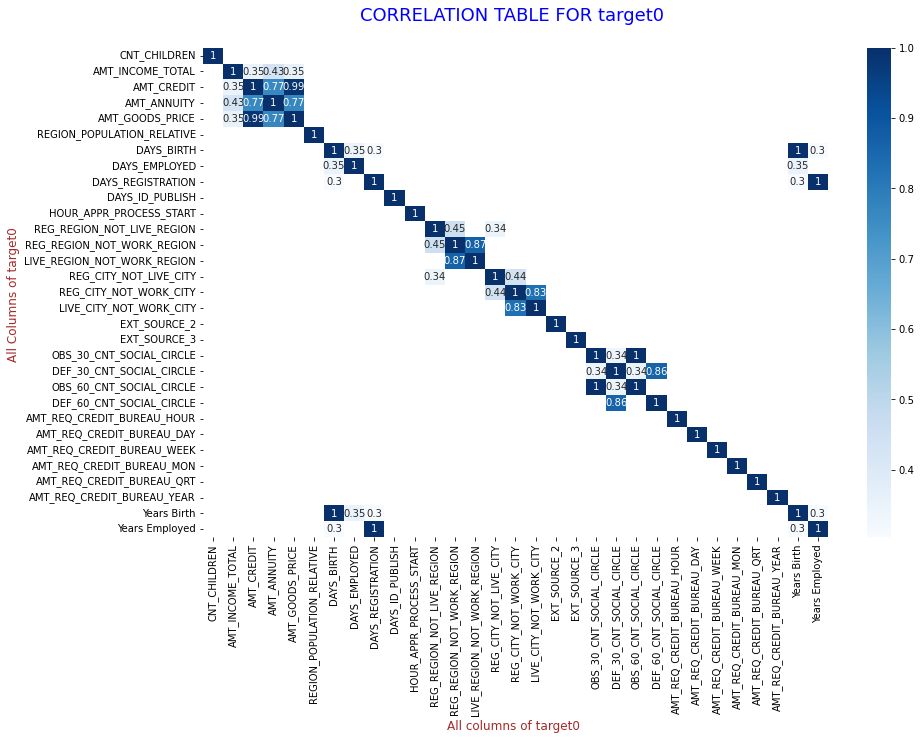

In [17]:
#plotting the correlation table of all variables of target0 dataframe
plt.figure(figsize=(14,9))
sns.heatmap(target0_correlation[target0_correlation>0.3],cmap='Blues',annot=True)
plt.title('CORRELATION TABLE FOR target0 \n',fontdict={'fontsize':18, 'fontweight' : 10, 'color' : 'Blue'})
plt.xlabel("All columns of target0 ", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.ylabel("All Columns of target0 ", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.show()

In [18]:
#Creating a correlation table between all the variables of targeto dataframe
target1_correlation=target1.iloc[:,2:].corr()
target1_correlation

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,...,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,Years Birth,Years Employed
CNT_CHILDREN,1.000000,0.002406,-0.002193,0.021129,-0.007596,-0.031845,-0.192051,-0.039228,-0.131810,0.095875,...,0.028819,0.006761,-0.001632,-0.010512,-0.009850,-0.018937,-0.020634,-0.030012,-0.192051,-0.131810
AMT_INCOME_TOTAL,0.002406,1.000000,0.032429,0.038903,0.031918,0.006259,0.005780,-0.002267,0.004562,0.007775,...,-0.006933,-0.005435,0.000173,-0.000502,-0.000150,0.003176,-0.001874,0.000012,0.005780,0.004562
AMT_CREDIT,-0.002193,0.032429,1.000000,0.748810,0.982353,0.076321,0.180908,0.098067,0.026689,0.060260,...,0.012304,-0.036934,-0.011392,-0.002647,0.010080,0.061843,-0.016567,-0.039836,0.180908,0.026689
AMT_ANNUITY,0.021129,0.038903,0.748810,1.000000,0.749478,0.076963,0.090668,0.045474,-0.020913,0.048712,...,0.000237,-0.027047,0.007491,-0.001006,0.038121,0.055451,-0.008415,-0.012610,0.090668,-0.020913
AMT_GOODS_PRICE,-0.007596,0.031918,0.982353,0.749478,1.000000,0.082723,0.176470,0.103646,0.025017,0.063414,...,0.011077,-0.031826,-0.010274,-0.000402,0.012579,0.065771,-0.015814,-0.043546,0.176470,0.025017
REGION_POPULATION_RELATIVE,-0.031845,0.006259,0.076321,0.076963,0.082723,1.000000,0.054426,0.014770,0.059615,0.009610,...,0.004227,0.015583,0.002056,-0.001082,0.009476,0.073607,-0.003864,-0.005910,0.054426,0.059615
DAYS_BIRTH,-0.192051,0.005780,0.180908,0.090668,0.176470,0.054426,1.000000,0.306802,0.236389,0.110620,...,0.003312,-0.014975,-0.014926,-0.003235,-0.002463,0.029693,0.010472,0.084448,1.000000,0.236389
DAYS_EMPLOYED,-0.039228,-0.002267,0.098067,0.045474,0.103646,0.014770,0.306802,1.000000,0.134480,0.090581,...,0.024902,0.004990,-0.014361,0.006683,0.009079,0.022115,-0.019720,0.019969,0.306802,0.134480
DAYS_REGISTRATION,-0.131810,0.004562,0.026689,-0.020913,0.025017,0.059615,0.236389,0.134480,1.000000,0.040681,...,-0.018768,-0.015649,0.002506,-0.001601,-0.008235,0.000727,0.009676,0.016332,0.236389,1.000000
DAYS_ID_PUBLISH,0.095875,0.007775,0.060260,0.048712,0.063414,0.009610,0.110620,0.090581,0.040681,1.000000,...,0.022190,-0.005375,-0.003890,0.011963,-0.004644,0.025020,-0.013451,0.037614,0.110620,0.040681


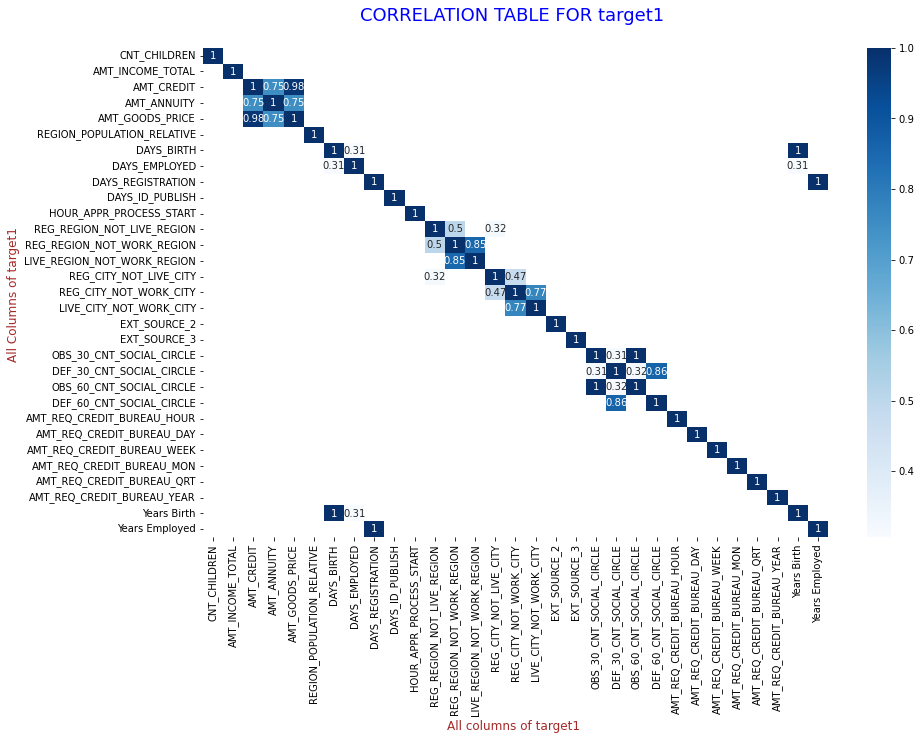

In [19]:
#plotting the correlation table of all variables of target1 dataframe
plt.figure(figsize=(14, 9))
sns.heatmap(target1_correlation[target1_correlation>0.3], cmap='Blues',annot=True)
plt.title('CORRELATION TABLE FOR target1 \n',fontdict={'fontsize': 18, 'fontweight' : 10, 'color' : 'Blue'})
plt.xlabel("All columns of target1 ", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.ylabel("All Columns of target1 ", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.show()

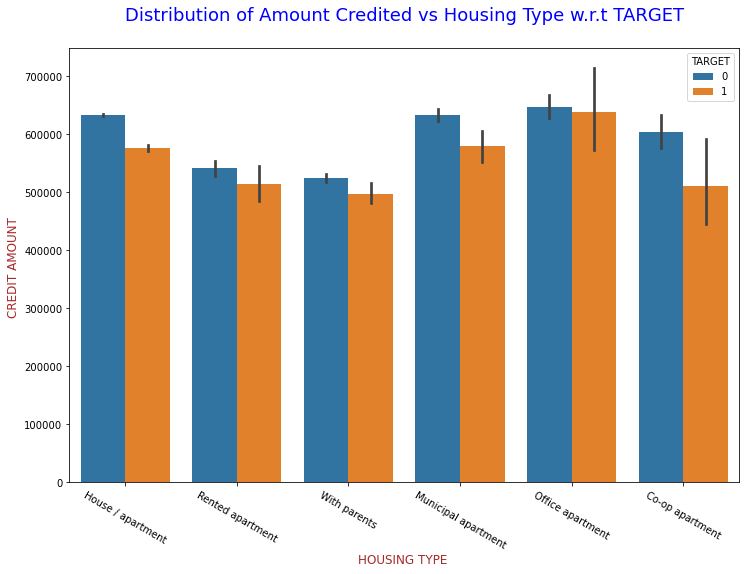

In [20]:
plt.figure(figsize=(12,8))
scale_factor=5
sns.barplot(data=bank_loan_df,x=bank_loan_df.NAME_HOUSING_TYPE,y=bank_loan_df.AMT_CREDIT,hue=bank_loan_df.TARGET)
plt.xticks(rotation=-30)
plt.xlabel("HOUSING TYPE ", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.ylabel("CREDIT AMOUNT ", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
#plt.yscale('log')
plt.title('Distribution of Amount Credited vs Housing Type w.r.t TARGET\n',fontdict={'fontsize': 18, 'fontweight' : 10, 'color' : 'Blue'})
plt.show()

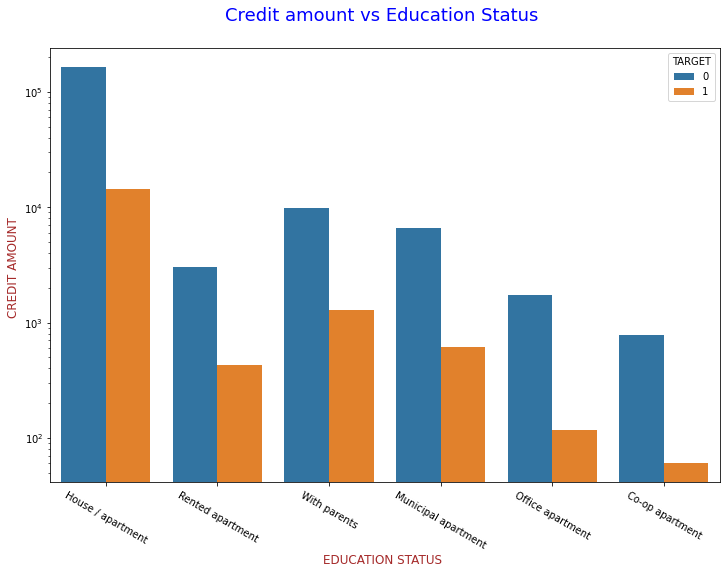

In [21]:
plt.figure(figsize=(12,8))
scale_factor=5
sns.countplot(data=bank_loan_df,x=bank_loan_df.NAME_HOUSING_TYPE,hue=bank_loan_df.TARGET)
plt.xticks(rotation=-30)
plt.xlabel("EDUCATION STATUS ", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.ylabel("CREDIT AMOUNT ", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.yscale('log')
plt.title('Credit amount vs Education Status \n',fontdict={'fontsize': 18, 'fontweight' : 10, 'color' : 'Blue'})
plt.show()

In [22]:
target0.shape

(185379, 46)

In [23]:
target1.shape

(16862, 46)

C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


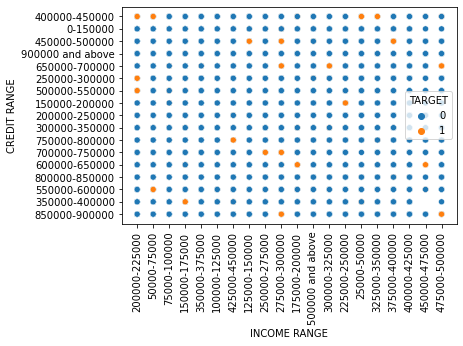

In [42]:
sns.scatterplot(data=bank_loan_df,x='INCOME RANGE',y='CREDIT RANGE',hue='TARGET')
# plt.yscale('log')
# plt.xscale('log')
plt.xticks(rotation='90')
plt.show()

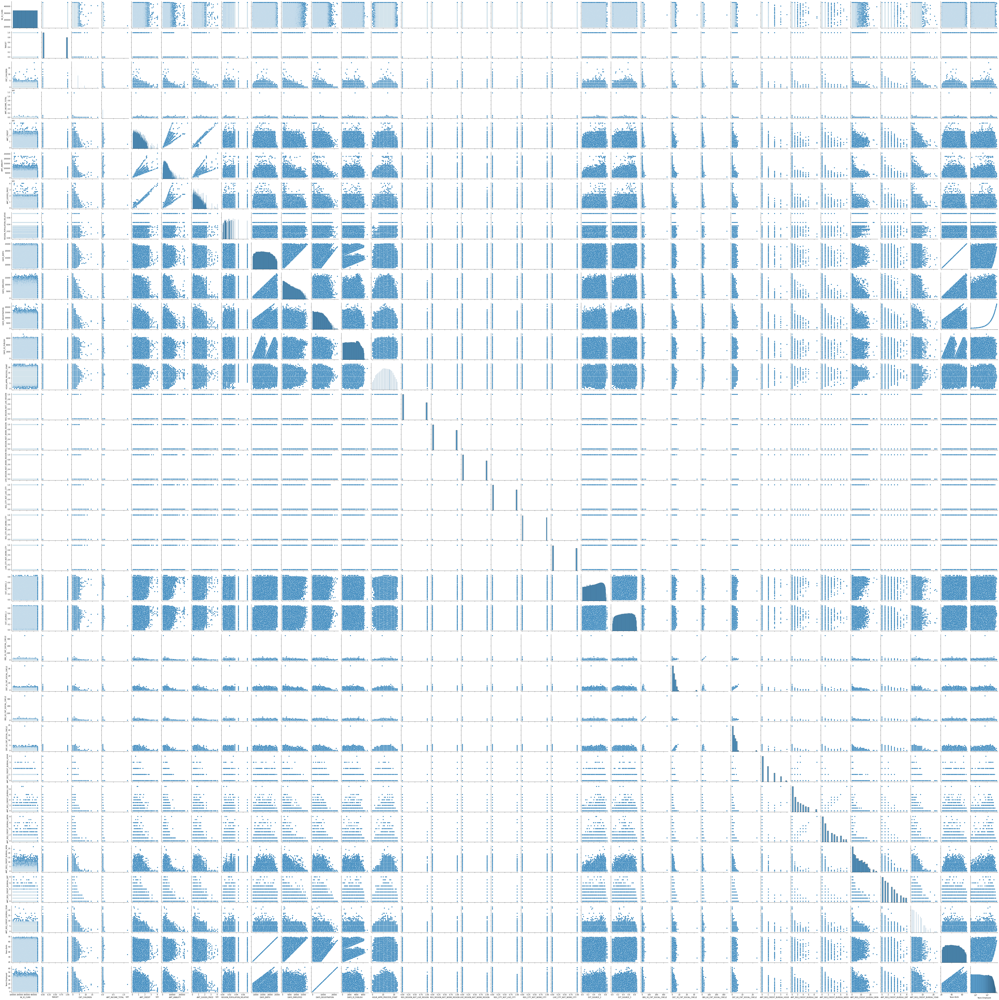

In [50]:
sns.pairplot(data=bank_loan_df)
plt.yscale('log')
plt.xscale('log')
plt.xticks(rotation='90')
plt.show()